# Latest Mark 2

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

In [19]:
def read_files(ddir):
    images = dict()
    ACCEPTED_FORMAT = ['jpg', 'png']
    for d in sorted(os.listdir(ddir)):
        if d.split('.')[1].lower() in ACCEPTED_FORMAT:
            fname = d.split('.')[0]
            print(f'reading {os.path.join(ddir, d)}...')
            images[fname] = cv2.imread(os.path.join(ddir, d))
            images[fname] = cv2.cvtColor(images[fname], cv2.COLOR_BGR2RGB)
    return images

def display_all(imgs, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def display_all_with(imgs, cc, subs=(10,10), fgsz=(15,18), use_gray=True):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k][:,:,cc], cmap='gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def save_plots(imgs, suptitle, savedir, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
    fig.suptitle(suptitle)
    fig.savefig(savedir) 

def adjust_gamma(image, gamma=1.0):
    table = np.array([((i / 255.0) ** gamma) * 255
      for i in np.arange(0, 256)]).astype("uint8")

    return cv2.LUT(image, table)

# Main

In [20]:
POSITIVE = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive'
NEGATIVE = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/negative'

In [21]:
pos = read_files(POSITIVE)

reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/036.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/069.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/158.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/159.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/160.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/228.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/229.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/245.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/247.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/273.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/277.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/289.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/293.jpg...
reading /hom

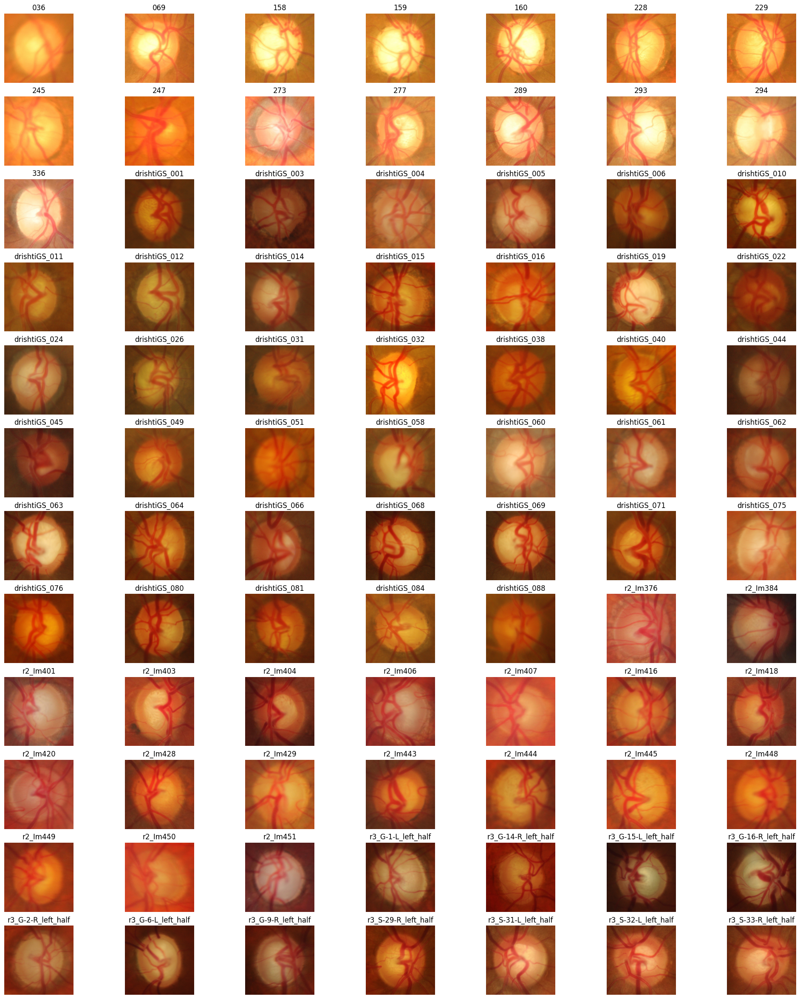

In [22]:
display_all(pos, (12, 7), (25, 30))

## Preprocess

In [23]:
def preprocess(imgs):
    prepro = {}
    convo_kernel = np.array([
        [0, -1, 0],
        [-1, 5, -1],
        [0, -1, 0]
    ]) # sharpen kernel
    
    for img in imgs:
        prepro[img] = cv2.filter2D(src=imgs[img], ddepth=-1, kernel=convo_kernel)
        prepro[img][:,:,0] = adjust_gamma(prepro[img][:,:,0], 1.5)
        
    # display_all(prepro, (12,7), (25,30))
    display_all_with(prepro, 1, (12,7), (25,30))
    return prepro
    

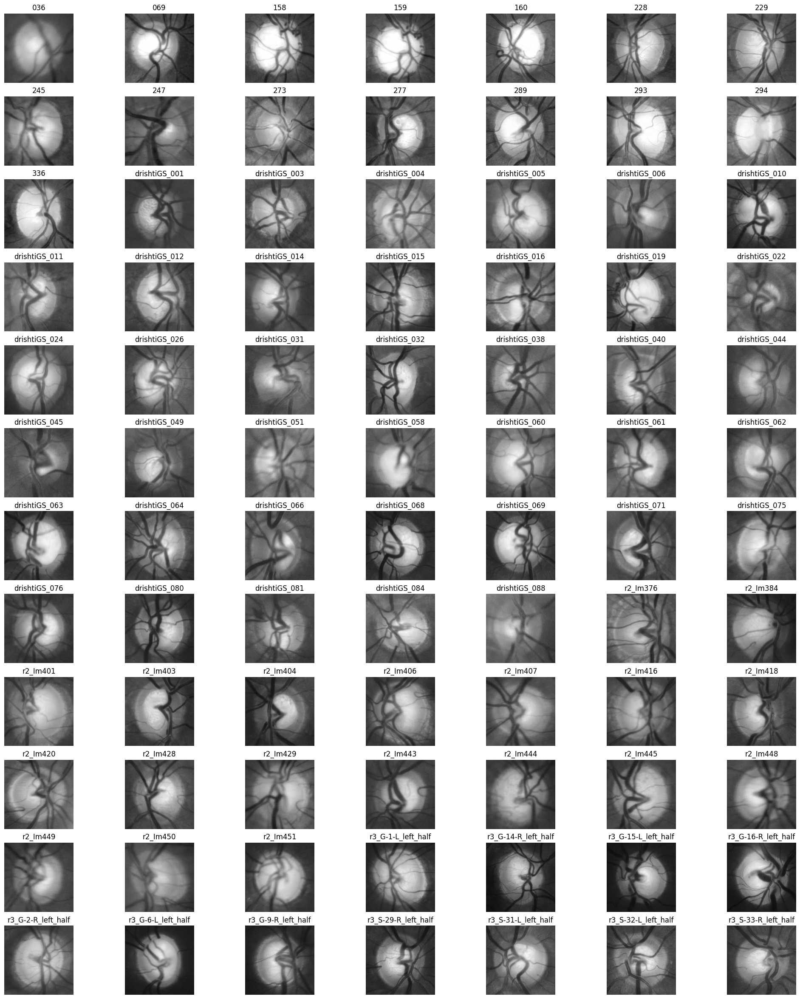

In [24]:
pre = preprocess(pos)

## Remove Vessels

In [25]:
def remove_vessels(imgs):
    no_vsl = {}
    clahe = cv2.createCLAHE(5, (8,8))
    
    for img in imgs:
        green = imgs[img][:,:,1]
        green_inv = 255-green
        clahed = clahe.apply(green_inv)
        g_gamma = adjust_gamma(clahed, 5)
        g_blur = cv2.medianBlur(g_gamma, 15)
        ret, th = cv2.threshold(g_blur,0,255,
                                cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        no_vsl[img] = cv2.inpaint(imgs[img].copy(), th, 10,cv2.INPAINT_TELEA)
    
    # display_all(no_vsl, (12,7), (25,30), True)
    #display_all_with(no_vsl, 0, (12,7), (25,30))
    return no_vsl

In [26]:
wo_vsl = remove_vessels(pre)

## OD Extraction

In [27]:
def get_which_ellipse(contours):
    conts = np.array([contour.shape[0] for contour in contours])
    cont_idx = np.argmax(conts)
    ellipse = cv2.fitEllipse(contours[cont_idx])
    return ellipse

def get_circle(contours):
    conts = np.array([contour.shape[0] for contour in contours])
    cont_idx = np.argmax(conts)
    (x,y), radius = cv2.minEnclosingCircle(contours[cont_idx])
    return (x,y), radius

def set_bleeds(img, trim_border=15):
    '''
    A bleed is a small area around the edge of 
    your artwork that extends beyond the “finished” 
    cut edge of your document.
    '''
    img[:, :trim_border] = 0
    img[:trim_border, :] = 0
    img[-trim_border:, :] = 0
    img[:, -trim_border:] = 0
    
    return img

def select_boundaries(bnrs, img):
    cont, hcy = cv2.findContours(bnrs, 
                                     cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    (x,y),radius = get_circle(cont)
    center = (int(x),int(y))
    radius = int(radius)
    return center, radius

def extract_od(imgs):
    # p = {} for development only
    ods = {}
    od_line = {}
    okernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15,15))
    print('hello od')
    
    for img in imgs:
        # ========== Preprocessing ==========
        hls = cv2.cvtColor(imgs[img], cv2.COLOR_RGB2HLS)
        lightness = adjust_gamma(hls[:,:,1], 1.5)
        blurred = cv2.GaussianBlur(lightness, (27, 27), 0)
        
        # ========== Segmentation ==========
        opened = cv2.morphologyEx(blurred, cv2.MORPH_OPEN, kernel=okernel)
        ret2, th2 = cv2.threshold(opened,0,255,
                                  cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        eroded = cv2.erode(th2, kernel=np.ones((5,5), np.uint8))
        binaries = set_bleeds(eroded, trim_border=25)
        
        # ========== Contours Processing ==========
        center, radius = select_boundaries(binaries, imgs[img])
        
        # ========== Result ==========
        od_line[img] = cv2.circle(imgs[img],center,radius,(0,255,0), 2)
        od = np.zeros_like(th2, dtype='uint8')
        ods[img] = cv2.circle(od, center, radius, (255, 255, 255), -1)
    print('success')
        
        
    # display_all_with(p, 1, (12,7), (25,30), True)
    # display_all(p, (12,7), (25,30), True)                             
                                  
    return od_line, ods

In [28]:
nvsl = wo_vsl.copy()

In [29]:
od_lines, all_od = extract_od(nvsl)

hello od
success


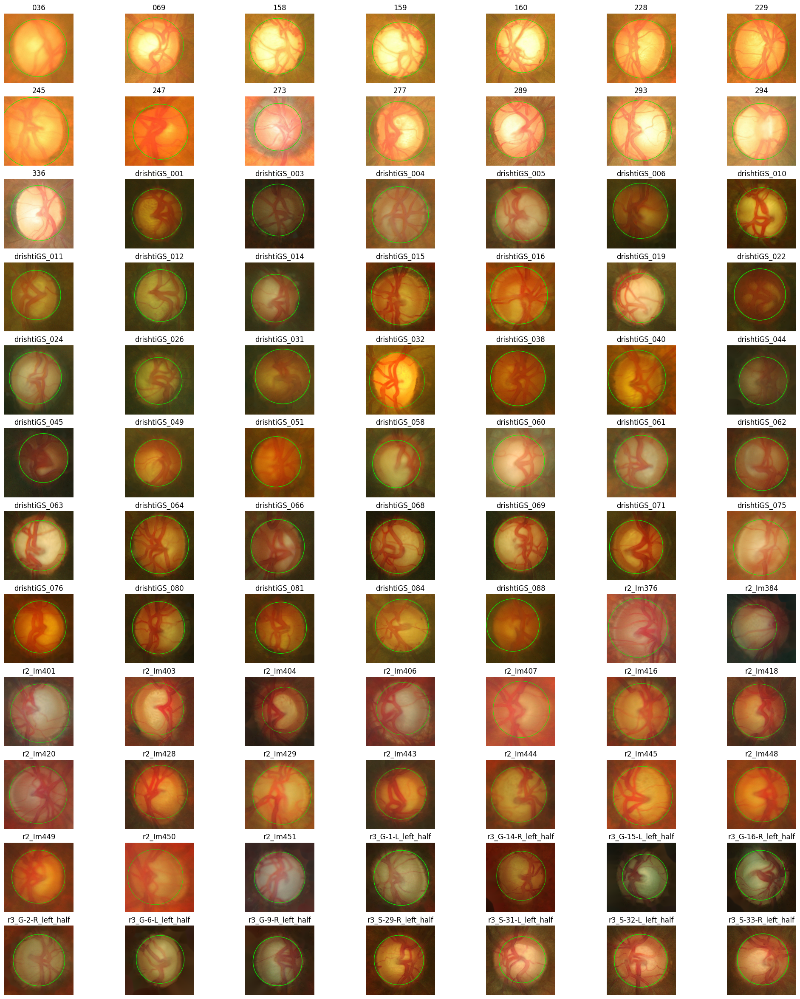

In [30]:
display_all(od_lines, (12,7), (25,30))

## OC Extractions

In [162]:
import copy

In [163]:
pc = copy.deepcopy(pos)

In [184]:
def get_which_ellipse(contours):
    conts = np.array([contour.shape[0] for contour in contours])
    cont_idx = np.argmax(conts)
    ellipse = cv2.fitEllipse(contours[cont_idx])
    return ellipse

def extract_oc(imgs):
    p = {}
    ocs = {}
    drawn_oc = {}
    for img in imgs:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (25,25))
        dilate = cv2.dilate(imgs[img], kernel)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15,15))
        erode = cv2.erode(dilate.copy(), kernel)
        blur = cv2.GaussianBlur(erode[:,:,1], (11,11), 0)
        p[img] = adjust_gamma(blur, 3)
        # ret3, p[img] = cv2.threshold(gammablur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
#         cont, hcy = cv2.findContours(th3.copy(), 
#                                      cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        
#         ellipse = get_which_ellipse(cont)
            
#         oc = np.zeros_like(th3, dtype='uint8')
#         cv2.ellipse(oc, ellipse, (255, 255, 255), -1)
#         ocs[img] = oc
#         drawn_oc[img] = ellipse
    display_all(p, (12,7), (25,30), True)

    return drawn_oc, ocs

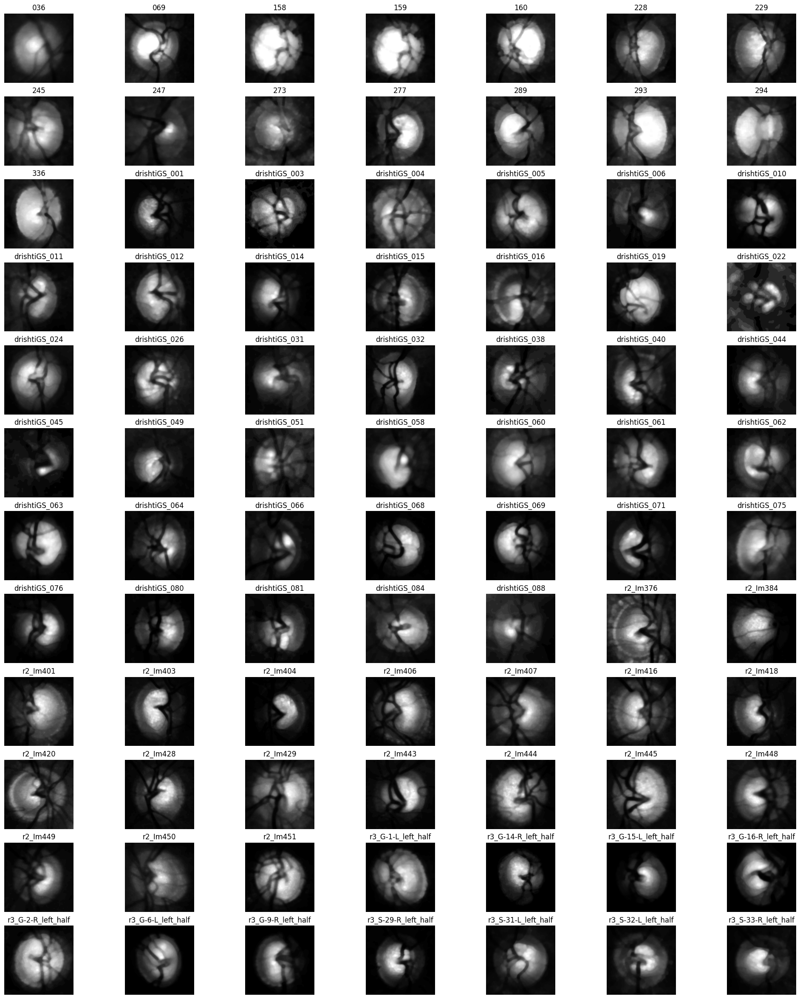

In [185]:
oc_lines, all_oc = extract_oc(pc)